In [1]:
## 2026.02.11 using FineST env
## 2026.02.12 vilization cell type of each ROI
## 2026.03.04 woody_pro:: upload the HE-StarDist embedding and predict the cell type of NCRT_tumor1  
## 2026.03.06 woody_pro:: clearn code 
## 2026.03.13 update cell type level1: nanually make codex_meta_celltype_level1.csv 
## 2026.03.16 use valis to make registration [dont try]
## 2026.03.18 delete two subtypes, adjust scale factor by batch
## 2026.03.19 Train and using NCRT_train.ipynb
## 2026.03.23 Adjust file name and path, then adjust model to use level1 and level2

In [1]:
import sys
import os
import importlib
import pandas as pd
from pathlib import Path

## Add the code directory to Python path
path = '/home/lingyu/ssd2/Python/'
code_dir = f'{path}Hist2Pheno/code/Hist2Pheno_pkg'
if code_dir not in sys.path:
    sys.path.insert(0, code_dir)

## Import (or reload) base module
import base
import plot
## Impost：Force reload base.py
importlib.reload(base)  
importlib.reload(plot)  

## Re-import the function (otherwise, still be old_version).
from base import (
    get_celltype_coords,
    divide_into_rois_by_parent,
    get_pixel_size,
    visualize_roi_cells,
    visualize_all_rois_with_he,
    visualize_all_rois,
    extract_and_save_celltype_by_tumorid,
    transformation_matrix_properties,
    invert_transformation_matrix,
    align_pcf_to_he_coordinates,
    add_pixel_coords,
    verify_transformation_alignment,
    merge_coordinates,
    analyze_and_filter_classes_by_gap,
    ImprovedMLPClassifier,
    load_embeddings,
    match_embeddings,
    prepare_matched_embeddings,
    evaluate,
    plot_per_class_f1,
    create_dataloaders,
    train_model,
    CellTypeDataset,
    evaluate_and_plot_on_all_data,
    align_matrix,
    match_StarCoords2ROI,
    match_celltype2stardist,
    merge_celltype_level12,
    make_PCF2HE_alignment,
    load_cell_pixcoords,load_hist_embeddings,
    match_hist2cell_matrix
)

from plot import (
    plot_celltype_distribution,
    visualize_all_celltype_distributions,
    plot_celltype_distribution,
    plot_celltype_spatial_distribution,
    plot_PCF_HE_counts,
    plot_WSI_counts,
    plot_cell_area_histogram,
    plot_confusion_matrix
)

## Import HAS_OPENSLIDE and HAS_TIFFFILE from base module for use in notebook
HAS_OPENSLIDE = base.HAS_OPENSLIDE
HAS_TIFFFILE = base.HAS_TIFFFILE

## Also import openslide module if available (needed for direct use in some cells)
if HAS_OPENSLIDE:
    import openslide
else:
    openslide = None

try:
    import tifffile
except ImportError:
    tifffile = None

print("Successfully reloaded functions from base.py")
print(f"openslide: {HAS_OPENSLIDE}, tifffile: {HAS_TIFFFILE}")


## reset pathway
os.chdir(f'{path}Hist2Pheno/data/CODEX/ESCC')
therapy_data = 'NCRT'
therapy_model = f'{therapy_data}_project_tumor1'
segment_data1 = f'{therapy_data}_project - seg 1-14'
segment_data2 = f'{therapy_data}_project - seg 15-28'
export_data = 'export'
save_result = 'result'

stardist_data = 'StarDist_Segment'
transfer_data = 'he_cell_coords'
qupath_corner = 'QupathCorners'

Successfully reloaded functions from base.py
openslide: False, tifffile: True


## Cell Type Classification Model

In [2]:
## Match embeddings with celltype data by coordinates
cell_coords_path = f'{path}Hist2Pheno/data/CODEX/ESCC/he_cell_coords/{therapy_data}_CellPixCoords_tumor1.csv'
hist_embedding_dir = Path(f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/ImgEmbeddings_tumor1/sc_pth_16_16')
matched_features_path = f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/matched_features_tumor1.npz'

# Coordinate matching tolerance in pixels (float supported).
# base.py now handles optional `celltype_level1` automatically.
match_tolerance = 1.0
X, y, y_level1, X_coords_matched = match_hist2cell_matrix(
    cell_coords_path,
    hist_embedding_dir,
    matched_features_path,
    coord_cols=('X_pix_HE', 'Y_pix_HE'),
    tolerance=match_tolerance,
)

Loading celltype Ground Truth ...
  Loaded 80303 cells
  Cell types: 40 unique types

Loading HIPT embeddings from .pth files...
  Loading embeddings...


Loading .pth files: 100%|██████████| 80303/80303 [00:14<00:00, 5587.71it/s]


  Successfully loaded 80303 embeddings
  Embedding dimension: (384,)

Loading pre-saved matched data...
  ✓ Loaded from /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1/matched_features_tumor1.npz
  X shape: (80303, 384)
  y shape: (80303,)
  Number of classes: 40
  ✓ Coordinates found in saved data
  ✓ Coordinates loaded: (80303, 2)


### Train and test datasets 

In [3]:
## Train/Test split (70% / 30%) with level2 and level1 labels
## Fix: stratified split fails when some classes appear only once.
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler

# level2 labels (fine-grained)
le_raw_l2 = LabelEncoder()
y_encoded_raw = le_raw_l2.fit_transform(y)

# level1 labels (coarse-grained)
le_level1 = LabelEncoder()
y_level1_encoded = le_level1.fit_transform(y_level1)
class_names_level1 = le_level1.classes_

## Filter out level2 classes with <2 samples
unique_labels, counts = np.unique(y_encoded_raw, return_counts=True)
keep_labels = unique_labels[counts >= 2]
mask = np.isin(y_encoded_raw, keep_labels)

X_f = X[mask]
y_f = y[mask]
y_level1_f = y_level1[mask]
y_level1_encoded_f = y_level1_encoded[mask]

# Re-encode filtered level2 labels to contiguous ids [0, ..., K-1]
# This avoids holes in class ids after filtering.
le = LabelEncoder()
y_encoded_f = le.fit_transform(y_f)
class_names = le.classes_

## If only 1 class remains, stratify must be disabled
strat = y_encoded_f if len(np.unique(y_encoded_f)) > 1 else None

(
    X_train,
    X_test,
    y_train,
    y_test,
    y_train_encoded,
    y_test_encoded,
    y_train_level1,
    y_test_level1,
    y_train_level1_encoded,
    y_test_level1_encoded,
) = train_test_split(
    X_f,
    y_f,
    y_encoded_f,
    y_level1_f,
    y_level1_encoded_f,
    test_size=0.3,
    random_state=42,
    stratify=strat,
)

print(f"\nTrain/Test split:")
print(f"  Training set: {X_train.shape[0]} samples")
print(f"  Test set: {X_test.shape[0]} samples")
print(f"  Feature dimension: {X_train.shape[1]}")
print(f"  Level2 classes: {len(class_names)}")
print(f"  Level1 classes: {len(class_names_level1)}")

## Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print("  Features standardized")


Train/Test split:
  Training set: 56211 samples
  Test set: 24091 samples
  Feature dimension: 384
  Level2 classes: 39
  Level1 classes: 7
  Features standardized


## MLP classifier

In [4]:
# CUDA/CPU sanity check for training setup
import os
import sys
import torch

print(sys.executable)
print(
    f"torch {torch.__version__} | built with CUDA: {torch.version.cuda} | "
    f"cuda.is_available: {torch.cuda.is_available()}"
)

if torch.cuda.is_available():
    device = torch.device("cuda")
    # Reproducibility-first: use deterministic cuDNN settings.
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    amp_scaler = torch.amp.GradScaler("cuda")  # AMP only on CUDA
    print(f"GPU: {torch.cuda.get_device_name(0)}")
else:
    allow_cpu = os.environ.get("NCRT_ALLOW_CPU_TRAIN", "").strip().lower() in ("1", "true", "yes")
    if allow_cpu:
        device, amp_scaler = torch.device("cpu"), None
        print("WARNING: CUDA unavailable, training on CPU (set NCRT_ALLOW_CPU_TRAIN=1).")
    else:
        raise RuntimeError(
            "CUDA unavailable. Please use a CUDA-enabled PyTorch build, "
            "or set NCRT_ALLOW_CPU_TRAIN=1 to run on CPU."
        )

print(f"device: {device}" + (f" | {torch.cuda.get_device_name(0)}" if device.type == "cuda" else ""))

/ssd2/users/lingyu/conda_envs/SeededNTM/bin/python
torch 2.9.1+cu130 | built with CUDA: 13.0 | cuda.is_available: True
GPU: NVIDIA RTX PRO 6000 Blackwell Server Edition
device: cuda | NVIDIA RTX PRO 6000 Blackwell Server Edition


In [5]:
# Reproducibility setup (run this first after kernel restart)
import os
import random
import numpy as np
import torch

SEED = 42
os.environ["PYTHONHASHSEED"] = str(SEED)
# Needed by CUDA for deterministic GEMM on some ops.
os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":4096:8"

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)
    torch.cuda.manual_seed_all(SEED)

# Enforce deterministic behavior (may reduce speed).
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
torch.use_deterministic_algorithms(True)

print(f"Reproducibility configured with SEED={SEED}")

Reproducibility configured with SEED=42


In [6]:
## Create hierarchical DataLoaders: (x, y_level2, y_level1)
import torch
from torch.utils.data import TensorDataset, DataLoader

use_cuda = torch.cuda.is_available()
batch_size = 1024 if use_cuda else 256
num_workers = 4 if use_cuda else 0
pin_memory = True if use_cuda else False

g = torch.Generator().manual_seed(SEED)

X_train_tensor = torch.as_tensor(X_train_scaled, dtype=torch.float32)
X_test_tensor = torch.as_tensor(X_test_scaled, dtype=torch.float32)
y_train_l2_tensor = torch.as_tensor(y_train_encoded, dtype=torch.long)
y_test_l2_tensor = torch.as_tensor(y_test_encoded, dtype=torch.long)
y_train_l1_tensor = torch.as_tensor(y_train_level1_encoded, dtype=torch.long)
y_test_l1_tensor = torch.as_tensor(y_test_level1_encoded, dtype=torch.long)

train_dataset = TensorDataset(X_train_tensor, y_train_l2_tensor, y_train_l1_tensor)
val_dataset = TensorDataset(X_test_tensor, y_test_l2_tensor, y_test_l1_tensor)

# For HCE training (needs both level2 and level1 labels)
train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=num_workers,
    pin_memory=pin_memory,
    generator=g,
)
val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size * 2,
    shuffle=False,
    num_workers=num_workers,
    pin_memory=pin_memory,
    generator=g,
)

# For existing evaluate(...) helper (expects x, y_level2)
val_eval_dataset = TensorDataset(X_test_tensor, y_test_l2_tensor)
val_loader_eval = DataLoader(
    val_eval_dataset,
    batch_size=batch_size * 2,
    shuffle=False,
    num_workers=num_workers,
    pin_memory=pin_memory,
    generator=g,
)

print(f"Train dataset size: {len(train_dataset)}")
print(f"Val dataset size: {len(val_dataset)}")
print(f"Batch size: {batch_size}")
print(f"Feature dimension: {X_train_scaled.shape[1]}")

Train dataset size: 56211
Val dataset size: 24091
Batch size: 1024
Feature dimension: 384


In [7]:
## Helper utilities shared by training/validation modes.
def infer_input_dim_and_num_classes(
    X_train_scaled,
    y_train_encoded,
    y_test_encoded,
    class_names=None,
):
    """Infer model input dimension and class count."""
    input_dim = X_train_scaled.shape[1]
    if class_names is not None:
        num_classes = len(class_names)
    else:
        # Use full label space to avoid out-of-bounds targets.
        num_classes = int(np.max(np.concatenate([y_train_encoded, y_test_encoded]))) + 1
    return input_dim, num_classes


def build_mlp_classifier(
    input_dim,
    num_classes,
    device,
    hidden_dims=(1024, 512, 256),
    dropout=0.2,
):
    """Create the MLP classifier on the given device."""
    return ImprovedMLPClassifier(
        input_dim=input_dim,
        num_classes=num_classes,
        hidden_dims=list(hidden_dims),
        dropout=dropout,
    ).to(device)


def get_best_checkpoint_path(path, therapy_data):
    """Return the checkpoint path saved during training."""
    return (
        f"{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/"
        f"{therapy_model}/best_mlp_gpu.pt"
    )


import torch.nn as nn
## 训练中途变成 nan
def train_and_save_model(
    device,
    X_train_scaled,
    train_loader,
    val_loader,
    evaluate,
    save_bestmodel_path,
    val_loader_eval=None,
    hce_lambda=0.5,
    patience=10,
    max_epochs=50,
    hidden_dims=(1024, 512, 256),
    dropout=0.2,
    lr=1e-3,
    weight_decay=5e-5,
):
    import time
    import torch.nn as nn
    import torch.nn.functional as F

    class HierarchicalCrossEntropyLoss(nn.Module):
        """
        HCE = CE(level2) + lambda * CE(level1-from-level2-logits)

        level1 logits are computed by aggregating level2 probabilities
        through a child-to-parent mapping matrix.
        """
        def __init__(self, child_to_parent, num_level1_classes, class_weights_level2=None, lambda_level1=0.5):
            super().__init__()
            self.lambda_level1 = float(lambda_level1)
            if class_weights_level2 is not None:
                self.register_buffer("class_weights_level2", class_weights_level2)
            else:
                self.class_weights_level2 = None

            # map_l2_to_l1[k, p] = 1 if level2 class k belongs to level1 class p
            map_l2_to_l1 = torch.zeros(len(child_to_parent), num_level1_classes, dtype=torch.float32)
            for k, p in enumerate(child_to_parent):
                map_l2_to_l1[k, int(p)] = 1.0
            self.register_buffer("map_l2_to_l1", map_l2_to_l1)

        def forward(self, logits_l2, target_l2, target_l1):
            # Keep HCE math in fp32 for numerical stability (especially with AMP).
            logits_fp32 = torch.nan_to_num(logits_l2.float(), nan=0.0, posinf=30.0, neginf=-30.0)

            # Standard CE on level2 labels.
            ce_l2 = F.cross_entropy(logits_fp32, target_l2, weight=self.class_weights_level2)

            # Aggregate child probabilities to parent probabilities.
            probs_l2 = torch.softmax(logits_fp32, dim=1)
            probs_l1 = torch.matmul(probs_l2, self.map_l2_to_l1)
            log_probs_l1 = torch.log(probs_l1.clamp_min(1e-6))
            ce_l1 = F.nll_loss(log_probs_l1, target_l1)

            total_loss = ce_l2 + self.lambda_level1 * ce_l1
            return total_loss, ce_l2.detach(), ce_l1.detach()

    # Create the parent directory safely (dirname() can be empty).
    save_dir = os.path.dirname(save_bestmodel_path)
    if save_dir:
        os.makedirs(save_dir, exist_ok=True)

    # Use AMP only on CUDA.
    amp_scaler = torch.amp.GradScaler(device.type) if device.type == "cuda" else None

    # Infer input dimension and class count.
    input_dim, num_classes = infer_input_dim_and_num_classes(
        X_train_scaled,
        y_train_encoded,
        y_test_encoded,
        class_names=class_names if "class_names" in globals() else None,
    )
    num_level1_classes = len(np.unique(y_train_level1_encoded))

    print("Model configuration:")
    print(f"  Input dimension: {input_dim}")
    print(f"  Number of level2 classes: {num_classes}")
    print(f"  Number of level1 classes: {num_level1_classes}")

    # Build model before creating optimizer/scheduler.
    model = build_mlp_classifier(
        input_dim=input_dim,
        num_classes=num_classes,
        device=device,
        hidden_dims=hidden_dims,
        dropout=dropout,
    )

    print(f"Model initialized on {device}")
    print(f"Model parameters: {sum(p.numel() for p in model.parameters()):,}")

    # Optimizer + scheduler.
    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=lr,
        weight_decay=weight_decay,
        betas=(0.9, 0.999),
        eps=1e-8,
    )

    from torch.optim.lr_scheduler import OneCycleLR
    scheduler = OneCycleLR(
        optimizer,
        max_lr=lr,
        epochs=max_epochs,
        steps_per_epoch=len(train_loader),
        pct_start=0.1,
        anneal_strategy="cos",
    )

    # Class weights for imbalanced level2 classes.
    unique_classes = np.unique(y_train_encoded)
    from sklearn.utils.class_weight import compute_class_weight

    cw = compute_class_weight("balanced", classes=unique_classes, y=y_train_encoded)
    full_weights = np.ones(num_classes, dtype=np.float64)
    full_weights[unique_classes.astype(int)] = cw
    class_weights_tensor = torch.as_tensor(full_weights, dtype=torch.float32, device=device)

    # Build level2 -> level1 mapping from the filtered dataset.
    child_to_parent = np.full(num_classes, -1, dtype=np.int64)
    for l2, l1 in zip(y_encoded_f, y_level1_encoded_f):
        if child_to_parent[int(l2)] == -1:
            child_to_parent[int(l2)] = int(l1)
        elif child_to_parent[int(l2)] != int(l1):
            raise ValueError(f"Inconsistent hierarchy: level2 class {l2} maps to multiple level1 classes")
    if np.any(child_to_parent < 0):
        missing = np.where(child_to_parent < 0)[0]
        raise ValueError(f"Missing level1 mapping for level2 classes: {missing}")

    criterion = HierarchicalCrossEntropyLoss(
        child_to_parent=child_to_parent,
        num_level1_classes=num_level1_classes,
        class_weights_level2=class_weights_tensor,
        lambda_level1=hce_lambda,
    ).to(device)

    print(f"HCE enabled: total_loss = CE(level2) + {hce_lambda:.3f} * CE(level1)")

    from sklearn.metrics import accuracy_score, f1_score

    def evaluate_level1_from_level2_logits(model, loader, device, child_to_parent_arr, num_l1):
        model.eval()
        all_preds_l1, all_labels_l1 = [], []

        map_l2_to_l1 = torch.zeros(len(child_to_parent_arr), num_l1, dtype=torch.float32, device=device)
        for k, p in enumerate(child_to_parent_arr):
            map_l2_to_l1[k, int(p)] = 1.0

        with torch.no_grad():
            for x, _, y_l1 in loader:
                x = x.to(device, non_blocking=True)
                y_l1 = y_l1.to(device, non_blocking=True)

                logits_l2 = model(x).float()
                probs_l2 = torch.softmax(logits_l2, dim=1)
                probs_l1 = torch.matmul(probs_l2, map_l2_to_l1)
                preds_l1 = torch.argmax(probs_l1, dim=1)

                all_preds_l1.append(preds_l1.cpu().numpy())
                all_labels_l1.append(y_l1.cpu().numpy())

        preds = np.concatenate(all_preds_l1)
        labels = np.concatenate(all_labels_l1)
        acc = accuracy_score(labels, preds)
        macro_f1 = f1_score(labels, preds, average="macro", zero_division=0)
        weighted_f1 = f1_score(labels, preds, average="weighted", zero_division=0)
        return acc, macro_f1, weighted_f1, preds, labels

    # Train with hierarchical targets.
    best_weighted_f1 = 0.0
    best_macro_f1 = 0.0
    best_epoch = 0
    counter = 0

    eval_loader = val_loader_eval if val_loader_eval is not None else val_loader

    print("Starting training with HCE...")
    print("=" * 60)

    for epoch in range(max_epochs):
        start_time = time.time()
        model.train()
        total_loss = 0.0
        total_ce_l2 = 0.0
        total_ce_l1 = 0.0
        num_batches = 0

        for x, y_l2, y_l1 in train_loader:
            x = x.to(device, non_blocking=True)
            y_l2 = y_l2.to(device, non_blocking=True)
            y_l1 = y_l1.to(device, non_blocking=True)

            optimizer.zero_grad()

            if amp_scaler is not None:
                with torch.amp.autocast("cuda"):
                    logits = model(x)
                    loss, ce_l2, ce_l1 = criterion(logits, y_l2, y_l1)
                if not torch.isfinite(loss):
                    print("  Warning: non-finite loss encountered (AMP), skipping batch.")
                    optimizer.zero_grad(set_to_none=True)
                    continue
                amp_scaler.scale(loss).backward()
                amp_scaler.unscale_(optimizer)
                torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
                amp_scaler.step(optimizer)
                amp_scaler.update()
            else:
                logits = model(x)
                loss, ce_l2, ce_l1 = criterion(logits, y_l2, y_l1)
                if not torch.isfinite(loss):
                    print("  Warning: non-finite loss encountered, skipping batch.")
                    optimizer.zero_grad(set_to_none=True)
                    continue
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
                optimizer.step()

            scheduler.step()
            total_loss += float(loss.item())
            total_ce_l2 += float(ce_l2.item())
            total_ce_l1 += float(ce_l1.item())
            num_batches += 1

        # Validation metrics for level2 (original) and level1 (hierarchical aggregation).
        val_acc, val_macro_f1, val_weighted_f1, _, _ = evaluate(model, eval_loader, device, amp_scaler)
        val_l1_acc, val_l1_macro_f1, val_l1_weighted_f1, _, _ = evaluate_level1_from_level2_logits(
            model, val_loader, device, child_to_parent, num_level1_classes
        )

        avg_loss = total_loss / max(num_batches, 1)
        avg_ce_l2 = total_ce_l2 / max(num_batches, 1)
        avg_ce_l1 = total_ce_l1 / max(num_batches, 1)
        current_lr = optimizer.param_groups[0]["lr"]
        epoch_time = time.time() - start_time

        print(f"\nEpoch {epoch + 1}/{max_epochs} ({epoch_time:.2f}s, LR: {current_lr:.6f})")
        print(f"  Train HCE Loss: {avg_loss:.4f}")
        print(f"  CE(level2): {avg_ce_l2:.4f}, CE(level1): {avg_ce_l1:.4f}")
        print(f"  Val L2 Accuracy: {val_acc:.4f}")
        print(f"  Val L2 Macro-F1: {val_macro_f1:.4f}")
        print(f"  Val L2 Weighted-F1: {val_weighted_f1:.4f}")
        print(f"  Val L1 Accuracy: {val_l1_acc:.4f}")
        print(f"  Val L1 Macro-F1: {val_l1_macro_f1:.4f}")
        print(f"  Val L1 Weighted-F1: {val_l1_weighted_f1:.4f}")

        if val_weighted_f1 > best_weighted_f1:
            best_weighted_f1 = val_weighted_f1
            best_macro_f1 = val_macro_f1
            best_epoch = epoch + 1
            torch.save(model.state_dict(), save_bestmodel_path)
            counter = 0
            print(
                f"  ✓ Best model saved (Weighted-F1: {best_weighted_f1:.4f}, Macro-F1: {best_macro_f1:.4f})"
            )
        else:
            counter += 1
            if counter >= patience:
                print(f"\nEarly stopping triggered at epoch {epoch + 1}")
                break

    print("=" * 60)
    print("Training completed!")
    print(f"Best validation Weighted-F1: {best_weighted_f1:.4f} at epoch {best_epoch}")
    print(f"Best validation Macro-F1: {best_macro_f1:.4f} at epoch {best_epoch}")

    return best_weighted_f1, best_macro_f1, best_epoch


In [8]:
## Path to save the best model
save_bestmodel_path = f"{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/best_mlp_gpu.pt"

best_weighted_f1, best_macro_f1, best_epoch = train_and_save_model(
    device,
    X_train_scaled,
    train_loader,
    val_loader,
    evaluate,
    save_bestmodel_path,
    val_loader_eval=val_loader_eval,
    hce_lambda=0.5,
    patience=10,
    max_epochs=50,
)

Model configuration:
  Input dimension: 384
  Number of level2 classes: 39
  Number of level1 classes: 7
Model initialized on cuda
Model parameters: 1,063,975
HCE enabled: total_loss = CE(level2) + 0.500 * CE(level1)
Starting training with HCE...


/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (1.66s, LR: 0.000132)
  Train HCE Loss: 6.9711
  CE(level2): 5.7480, CE(level1): 2.4461
  Val L2 Accuracy: 0.2441
  Val L2 Macro-F1: 0.0651
  Val L2 Weighted-F1: 0.2303
  Val L1 Accuracy: 0.4231
  Val L1 Macro-F1: 0.3711
  Val L1 Weighted-F1: 0.4136
  ✓ Best model saved (Weighted-F1: 0.2303, Macro-F1: 0.0651)

Epoch 2/50 (1.30s, LR: 0.000374)
  Train HCE Loss: 5.3082
  CE(level2): 4.4361, CE(level1): 1.7442
  Val L2 Accuracy: 0.2881
  Val L2 Macro-F1: 0.0856
  Val L2 Weighted-F1: 0.2751
  Val L1 Accuracy: 0.4691
  Val L1 Macro-F1: 0.4202
  Val L1 Weighted-F1: 0.4623
  ✓ Best model saved (Weighted-F1: 0.2751, Macro-F1: 0.0856)

Epoch 3/50 (1.36s, LR: 0.000671)
  Train HCE Loss: 4.5100
  CE(level2): 3.7444, CE(level1): 1.5310
  Val L2 Accuracy: 0.3041
  Val L2 Macro-F1: 0.0901
  Val L2 Weighted-F1: 0.2835
  Val L1 Accuracy: 0.4878
  Val L1 Macro-F1: 0.4391
  Val L1 Weighted-F1: 0.4804
  ✓ Best model saved (Weighted-F1: 0.2835, Macro-F1: 0.0901)

Epoch 4/50 (1.59s, LR: 0.00091

In [9]:
# Override mode_validation: report both level2 and level1 metrics.
def mode_validation(
    val_loader,
    device,
    path,
    therapy_data,
    X_train_scaled,
    y_train_encoded,
    y_test_encoded,
    class_names=None,
    class_names_level1=None,
    hidden_dims=(1024, 512, 256),
    dropout=0.2,
):
    from sklearn.metrics import classification_report, accuracy_score, f1_score

    input_dim, num_classes = infer_input_dim_and_num_classes(
        X_train_scaled,
        y_train_encoded,
        y_test_encoded,
        class_names=class_names,
    )

    model = build_mlp_classifier(
        input_dim=input_dim,
        num_classes=num_classes,
        device=device,
        hidden_dims=hidden_dims,
        dropout=dropout,
    )

    checkpoint_path = get_best_checkpoint_path(path, therapy_data)
    state_dict = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(state_dict)

    # Level2 validation
    eval_loader = val_loader_eval if 'val_loader_eval' in globals() else val_loader
    val_acc, val_macro_f1, val_weighted_f1, val_preds, val_labels = evaluate(model, eval_loader, device)

    print("\nValidation Performance (Level2, best checkpoint):")
    print(f"  Accuracy: {val_acc:.4f}")
    print(f"  Macro F1-score: {val_macro_f1:.4f}")
    print(f"  Weighted F1-score: {val_weighted_f1:.4f}")

    unique_labels = np.unique(np.concatenate([val_labels, val_preds]))
    actual_class_names = [class_names[i] for i in unique_labels] if class_names is not None else [str(i) for i in unique_labels]
    print("\nDetailed Classification Report (Level2):")
    print(classification_report(val_labels, val_preds, labels=unique_labels, target_names=actual_class_names, zero_division=0))

    # Build level2->level1 mapping
    child_to_parent = np.full(num_classes, -1, dtype=np.int64)
    for l2, l1 in zip(y_encoded_f, y_level1_encoded_f):
        if child_to_parent[int(l2)] == -1:
            child_to_parent[int(l2)] = int(l1)
    if np.any(child_to_parent < 0):
        missing = np.where(child_to_parent < 0)[0]
        raise ValueError(f"Missing level1 mapping for level2 classes in validation: {missing}")

    num_level1_classes = int(np.max(child_to_parent)) + 1
    map_l2_to_l1 = torch.zeros(num_classes, num_level1_classes, dtype=torch.float32, device=device)
    for k, p in enumerate(child_to_parent):
        map_l2_to_l1[k, int(p)] = 1.0

    # Level1 validation by aggregating level2 probabilities
    model.eval()
    val_preds_level1_list, val_labels_level1_list = [], []
    with torch.no_grad():
        for x, _, y_l1 in val_loader:
            x = x.to(device, non_blocking=True)
            y_l1 = y_l1.to(device, non_blocking=True)

            logits_l2 = model(x).float()
            probs_l2 = torch.softmax(logits_l2, dim=1)
            probs_l1 = torch.matmul(probs_l2, map_l2_to_l1)
            preds_l1 = torch.argmax(probs_l1, dim=1)

            val_preds_level1_list.append(preds_l1.cpu().numpy())
            val_labels_level1_list.append(y_l1.cpu().numpy())

    val_preds_level1 = np.concatenate(val_preds_level1_list)
    val_labels_level1 = np.concatenate(val_labels_level1_list)

    val_level1_acc = accuracy_score(val_labels_level1, val_preds_level1)
    val_level1_macro_f1 = f1_score(val_labels_level1, val_preds_level1, average="macro", zero_division=0)
    val_level1_weighted_f1 = f1_score(val_labels_level1, val_preds_level1, average="weighted", zero_division=0)

    print("\nValidation Performance (Level1):")
    print(f"  Accuracy: {val_level1_acc:.4f}")
    print(f"  Macro F1-score: {val_level1_macro_f1:.4f}")
    print(f"  Weighted F1-score: {val_level1_weighted_f1:.4f}")

    unique_labels_l1 = np.unique(np.concatenate([val_labels_level1, val_preds_level1]))
    actual_class_names_l1 = [class_names_level1[i] for i in unique_labels_l1] if class_names_level1 is not None else [str(i) for i in unique_labels_l1]
    print("\nDetailed Classification Report (Level1):")
    print(classification_report(val_labels_level1, val_preds_level1, labels=unique_labels_l1, target_names=actual_class_names_l1, zero_division=0))

    return (
        model,
        input_dim,
        val_acc,
        val_macro_f1,
        val_weighted_f1,
        val_preds,
        val_labels,
        val_level1_acc,
        val_level1_macro_f1,
        val_level1_weighted_f1,
        val_preds_level1,
        val_labels_level1,
    )

In [10]:
## Validate model on validation dataset (both level2 and level1)
(
    model,
    input_dim,
    val_acc,
    val_macro_f1,
    val_weighted_f1,
    val_preds,
    val_labels,
    val_level1_acc,
    val_level1_macro_f1,
    val_level1_weighted_f1,
    val_preds_level1,
    val_labels_level1,
) = mode_validation(
    val_loader=val_loader,
    device=device,
    path=path,
    therapy_data=therapy_data,
    X_train_scaled=X_train_scaled,
    y_train_encoded=y_train_encoded,
    y_test_encoded=y_test_encoded,
    class_names=class_names if 'class_names' in globals() else None,
    class_names_level1=class_names_level1 if 'class_names_level1' in globals() else None,
)


Validation Performance (Level2, best checkpoint):
  Accuracy: 0.4032
  Macro F1-score: 0.1472
  Weighted F1-score: 0.3893

Detailed Classification Report (Level2):
                       precision    recall  f1-score   support

              B_other       0.05      0.12      0.07       128
      B_proliferating       0.00      0.00      0.00        18
          Bm_switched       0.01      0.04      0.02       113
        Bm_unswitched       0.04      0.11      0.06       106
                   Bn       0.00      0.00      0.00        21
               CAF_ap       0.02      0.16      0.03        67
            CAF_other       0.22      0.12      0.15      1254
              CD4_Tcm       0.00      0.00      0.00         1
              CD4_Tem       0.01      0.05      0.02        82
              CD4_Tex       0.11      0.07      0.08       751
               CD4_Tn       0.00      0.00      0.00        16
             CD8_Teff       0.08      0.19      0.11       217
              C

Computing confusion matrix...
Figure saved to NCRT/result/conf_matrix_tumor1_level2_hce.pdf


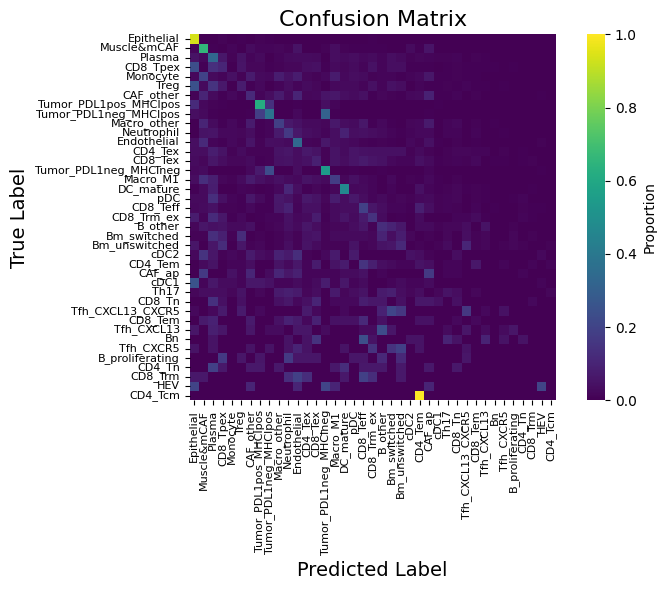

Computing confusion matrix...
Figure saved to NCRT/result/conf_matrix_tumor1_level1_hce.pdf


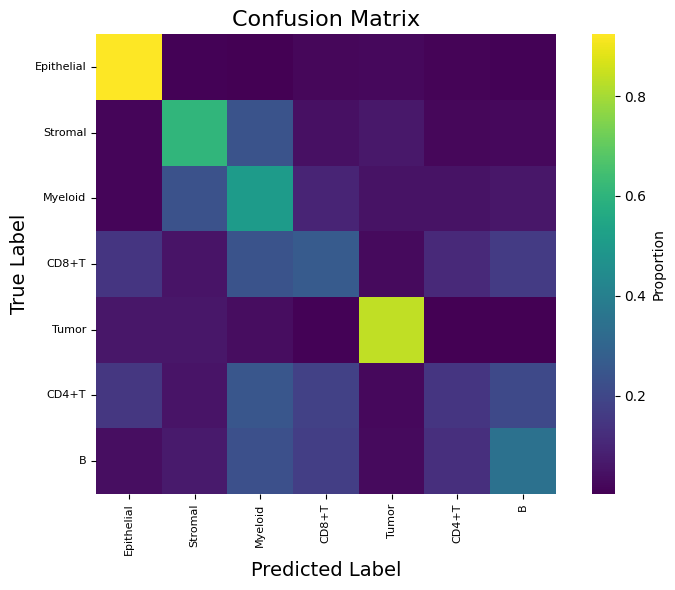

In [11]:
# Level2 confusion matrix
plot_confusion_matrix(
    val_labels,
    val_preds,
    class_names,
    save_path=f'{therapy_data}/{save_result}/conf_matrix_tumor1_level2_hce.pdf',
)

# Level1 confusion matrix
plot_confusion_matrix(
    val_labels_level1,
    val_preds_level1,
    class_names_level1,
    save_path=f'{therapy_data}/{save_result}/conf_matrix_tumor1_level1_hce.pdf',
)

In [12]:
# Save level2 + level1 validation metrics for HCE-lambda comparison.
import os
import pandas as pd
from datetime import datetime

hce_lambda_used = hce_lambda if 'hce_lambda' in globals() else 0.5

metrics_row = {
    "timestamp": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    "therapy_data": therapy_data,
    "best_epoch": int(best_epoch) if 'best_epoch' in globals() else None,
    "hce_lambda": float(hce_lambda_used),
    "val_l2_accuracy": float(val_acc),
    "val_l2_macro_f1": float(val_macro_f1),
    "val_l2_weighted_f1": float(val_weighted_f1),
    "val_l1_accuracy": float(val_level1_acc),
    "val_l1_macro_f1": float(val_level1_macro_f1),
    "val_l1_weighted_f1": float(val_level1_weighted_f1),
    "num_l2_classes": int(len(class_names)) if 'class_names' in globals() else None,
    "num_l1_classes": int(len(class_names_level1)) if 'class_names_level1' in globals() else None,
}

metrics_df = pd.DataFrame([metrics_row])


metrics_csv_path = f"{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{save_result}/hce_lambda_validation_metrics.csv"
if os.path.exists(metrics_csv_path):
    existing_df = pd.read_csv(metrics_csv_path)
    combined_df = pd.concat([existing_df, metrics_df], ignore_index=True)
else:
    combined_df = metrics_df.copy()

combined_df.to_csv(metrics_csv_path, index=False)

print("Current run metrics:")
print(metrics_df)
print(f"\nSaved comparison table to: {metrics_csv_path}")
print(f"Total rows: {len(combined_df)}")

Current run metrics:
             timestamp therapy_data  best_epoch  hce_lambda  val_l2_accuracy  \
0  2026-03-23 17:53:17         NCRT          49         0.5         0.403221   

   val_l2_macro_f1  val_l2_weighted_f1  val_l1_accuracy  val_l1_macro_f1  \
0         0.147225            0.389346         0.569134         0.508784   

   val_l1_weighted_f1  num_l2_classes  num_l1_classes  
0            0.552447              39               7  

Saved comparison table to: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/result/hce_lambda_validation_metrics.csv
Total rows: 2


Visualizing per-class performance...
  ✓ Computed metrics for 39 classes
Figure saved to NCRT/result/f1_per_class_tumor1_level2_hce.pdf


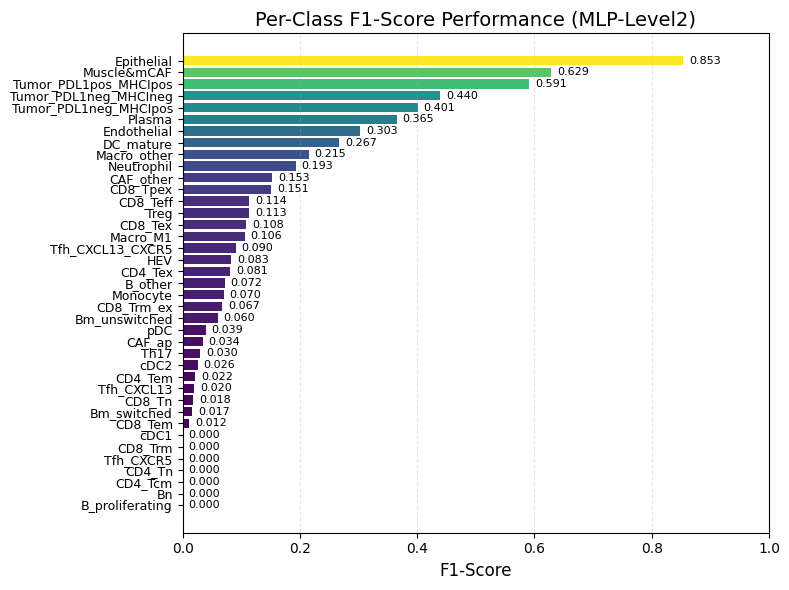


Model Summary:
  Device: cuda
  Training samples: 56211
  Test samples: 24091
  Total classes (before filtering): 39
  Actual classes in test set: 39
  Feature dimension: 384
  Model parameters: 1,063,975
  Best epoch: 49
  Test Accuracy: 0.4032
  Test Macro F1: 0.1472
  Test Weighted F1: 0.3893
Visualizing per-class performance...
  ✓ Computed metrics for 7 classes
Figure saved to NCRT/result/f1_per_class_tumor1_level1_hce.pdf


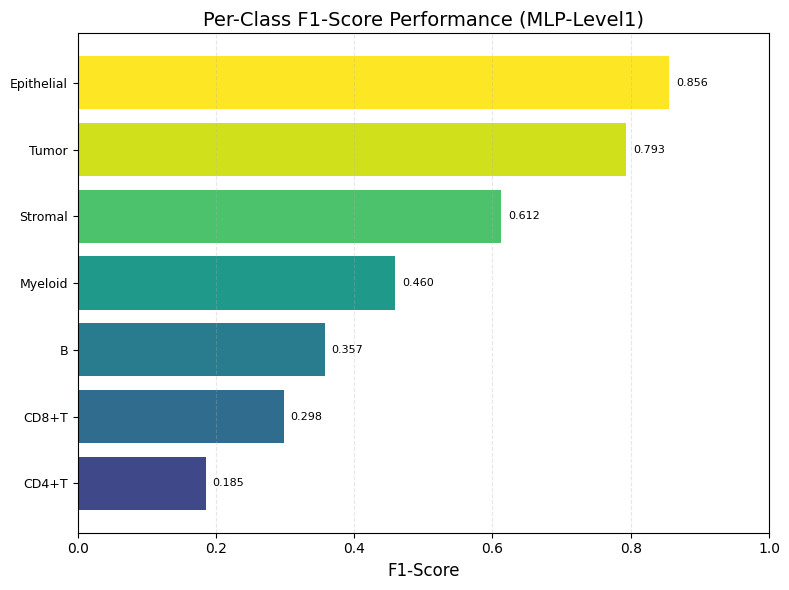


Model Summary:
  Device: cuda
  Training samples: 56211
  Test samples: 24091
  Total classes (before filtering): 7
  Actual classes in test set: 7
  Feature dimension: 384
  Model parameters: 1,063,975
  Best epoch: 49
  Test Accuracy: 0.5691
  Test Macro F1: 0.5088
  Test Weighted F1: 0.5524


In [13]:
# Per-class F1 for level2
metrics_df_level2 = plot_per_class_f1(
    val_labels,
    val_preds,
    class_names,
    model=model,
    device=device,
    train_dataset=train_dataset,
    val_dataset=val_dataset,
    input_dim=input_dim,
    best_epoch=best_epoch,
    test_acc=val_acc,
    test_macro_f1=val_macro_f1,
    test_weighted_f1=val_weighted_f1,
    model_name="MLP-Level2",
    save_path=f'{therapy_data}/{save_result}/f1_per_class_tumor1_level2_hce.pdf',
)

# Per-class F1 for level1
metrics_df_level1 = plot_per_class_f1(
    val_labels_level1,
    val_preds_level1,
    class_names_level1,
    model=model,
    device=device,
    train_dataset=train_dataset,
    val_dataset=val_dataset,
    input_dim=input_dim,
    best_epoch=best_epoch,
    test_acc=val_level1_acc,
    test_macro_f1=val_level1_macro_f1,
    test_weighted_f1=val_level1_weighted_f1,
    model_name="MLP-Level1",
    save_path=f'{therapy_data}/{save_result}/f1_per_class_tumor1_level1_hce.pdf',
)

  Loading data from matched_features_path...
  ✓ Loaded X from /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1/matched_features_tumor1.npz: (80303, 384)
  ✓ Loaded y from /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1/matched_features_tumor1.npz: (80303,), dtype: <U21
  ⚠ Note: Labels will be used for evaluation. If encoding mismatch occurs, set prediction_only=True.
  ⚠ y contains string labels. Encoding to integers...
  ⚠ Warning: New LabelEncoder may produce different encoding than training!
  ⚠ This can cause label mismatch if data has different classes than training.
  ✓ Encoded y to integers: (80303,), dtype: int64
  ⚠ Encoded labels have 40 unique classes (0-39)
  ⚠ Model expects unknown classes
  ✓ Scaled X using provided scaler
  X_all_scaled shape: (80303, 384)
  y_all_encoded shape: (80303,)
  ✓ Final y_all_encoded dtype: int64
X_all_scaled:  (80303, 384)
y_all_encoded:  (80303,)
  ⚠ Large dataset detected (80303 samples).

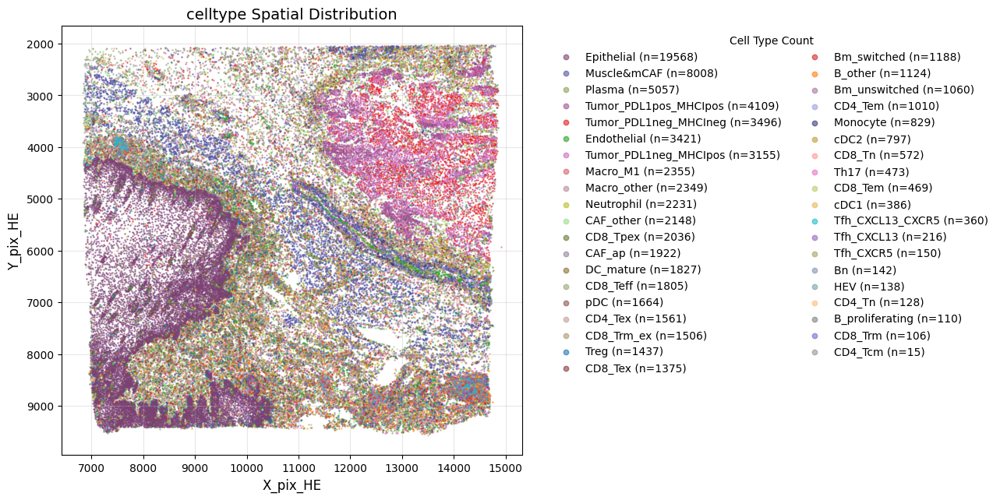

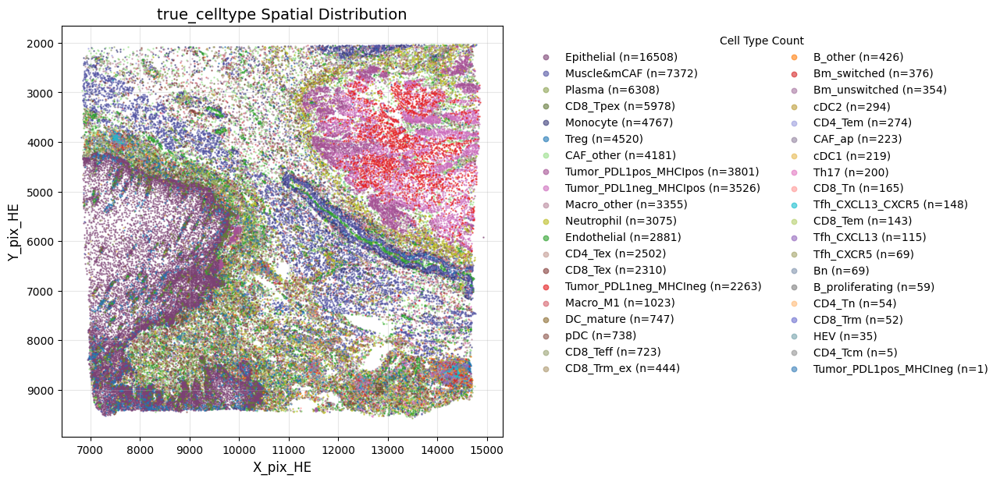

In [14]:
## Evaluate on all data and plot spatial distribution
all_acc, all_macro_f1, all_weighted_f1, all_preds, all_labels = evaluate_and_plot_on_all_data(
    model=model,
    matched_features_path=matched_features_path,
    class_names=class_names,
    evaluate=evaluate,
    plot_celltype_spatial_distribution=plot_celltype_spatial_distribution,
    CellTypeDataset=CellTypeDataset,
    device=device,
    scaler=scaler,
    val_loader=val_loader if 'val_loader' in globals() else None,
    X=X if 'X' in globals() else None,
    y=y if 'y' in globals() else None,
    y_encoded=y_encoded if 'y_encoded' in globals() else None,
    X_train=X_train if 'X_train' in globals() else None,
    X_train_scaled=X_train_scaled if 'X_train_scaled' in globals() else None,
    X_test_scaled=X_test_scaled if 'X_test_scaled' in globals() else None,
    y_train_encoded=y_train_encoded if 'y_train_encoded' in globals() else None,
    y_test_encoded=y_test_encoded if 'y_test_encoded' in globals() else None,
    min_samples_per_class=min_samples_per_class if 'min_samples_per_class' in globals() else 29,
    X_coords_matched=X_coords_matched if 'X_coords_matched' in globals() else None,
    celltype_pred_dir = f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{save_result}/celltype_valid_tumor1_level2_hce.jpg',
    celltype_pixel_NCRT_tumor1=celltype_pixel_NCRT_tumor1 if 'celltype_pixel_NCRT_tumor1' in globals() else None
)

In [31]:
import numpy as np
import pandas as pd

def plot_level1_spatial_distribution(
    matched_features_path,
    all_preds,
    class_names_level1,
    class_names,
    y_encoded_f,
    y_level1_encoded_f,
    plot_celltype_spatial_distribution,
    save_path_pred=None,
    save_path_true=None,
):
    """
    Plot level1 spatial distribution from all-data predictions.

    Args:
        matched_features_path (str): Path to .npz file containing coordinates and true labels.
        all_preds (array-like): Predicted level2 class indices for all cells.
        class_names_level1 (list): List of level1 class names (for display).
        class_names (list): List of level2 class names (for mapping).
        y_encoded_f (array-like): Level2 encoded labels for mapping.
        y_level1_encoded_f (array-like): Corresponding level1 encoded labels for mapping.
        plot_celltype_spatial_distribution (function): Plotting function.
        save_path_pred (str or None): Path for saving prediction spatial plot.
        save_path_true (str or None): Path for saving true spatial plot.
    """

    # Load matched features and check presence of coordinates
    loaded_data = np.load(matched_features_path)
    if 'X_coords' not in loaded_data:
        raise ValueError(f"X_coords not found in {matched_features_path}")

    X_coords_all = loaded_data['X_coords']
    all_preds_l2 = np.asarray(all_preds)
    n = min(len(X_coords_all), len(all_preds_l2))
    X_coords_all = X_coords_all[:n]
    all_preds_l2 = all_preds_l2[:n]

    # Build level2->level1 mapping (same mapping used in HCE training).
    num_l2_classes = len(class_names)
    child_to_parent = np.full(num_l2_classes, -1, dtype=np.int64)
    for l2, l1 in zip(y_encoded_f, y_level1_encoded_f):
        if child_to_parent[int(l2)] == -1:
            child_to_parent[int(l2)] = int(l1)
    if np.any(child_to_parent < 0):
        missing = np.where(child_to_parent < 0)[0]
        raise ValueError(f"Missing level1 mapping for level2 classes: {missing}")

    preds_l1 = child_to_parent[all_preds_l2]
    pred_celltype_l1 = np.array([class_names_level1[int(i)] for i in preds_l1])

    pred_df_l1 = pd.DataFrame({
        'X_pix_HE': X_coords_all[:, 0],
        'Y_pix_HE': X_coords_all[:, 1],
        'celltype': pred_celltype_l1,
    })

    # Add true level1 labels if available in cached npz.
    if 'y_level1' in loaded_data:
        y_l1_raw = loaded_data['y_level1'][:n]
        if y_l1_raw.dtype.kind in ['U', 'S', 'O']:
            pred_df_l1['true_celltype'] = y_l1_raw
        else:
            pred_df_l1['true_celltype'] = np.array([class_names_level1[int(i)] for i in y_l1_raw])

    # Plot predicted celltype spatial distribution
    plot_celltype_spatial_distribution(
        pred_df_l1,
        x_col='X_pix_HE',
        y_col='Y_pix_HE',
        celltype_col='celltype',
        figsize=(12, 10),
        alpha=0.6,
        s=0.6,
        format='jpg',
        save_path=save_path_pred,
    )

    # Optionally, plot true celltype spatial distribution if available
    if 'true_celltype' in pred_df_l1.columns:
        plot_celltype_spatial_distribution(
            pred_df_l1,
            x_col='X_pix_HE',
            y_col='Y_pix_HE',
            celltype_col='true_celltype',
            figsize=(12, 10),
            alpha=0.6,
            s=0.6,
            format='jpg',
            save_path=save_path_true,
        )

    # return pred_df_l1

In [ ]:
save_path_pred = f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{save_result}/celltype_valid_tumor1_level1_hce.jpg'
save_path_true = f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{save_result}/celltype_true_tumor1_level1_hce.jpg'
plot_level1_spatial_distribution(
    matched_features_path=matched_features_path,
    all_preds=all_preds,
    class_names_level1=class_names_level1,
    class_names=class_names,
    y_encoded_f=y_encoded_f,
    y_level1_encoded_f=y_level1_encoded_f,
    plot_celltype_spatial_distribution=plot_celltype_spatial_distribution,
    save_path_pred=save_path_pred,
    save_path_true=save_path_true
)

Number of valid data points: 80303
Number of cell types: 7
Number of valid data points: 80303
Number of cell types: 7


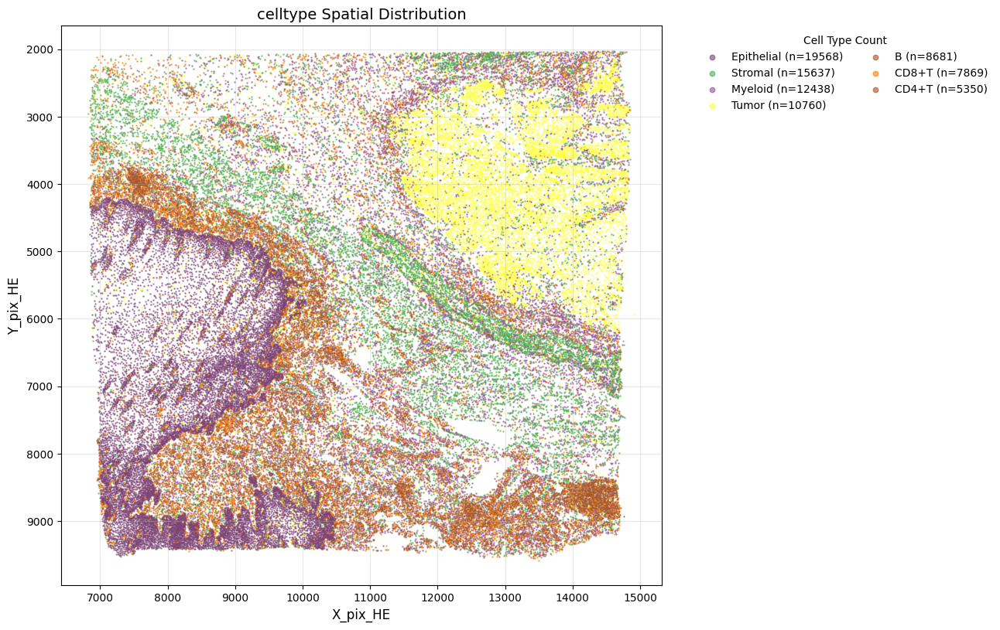

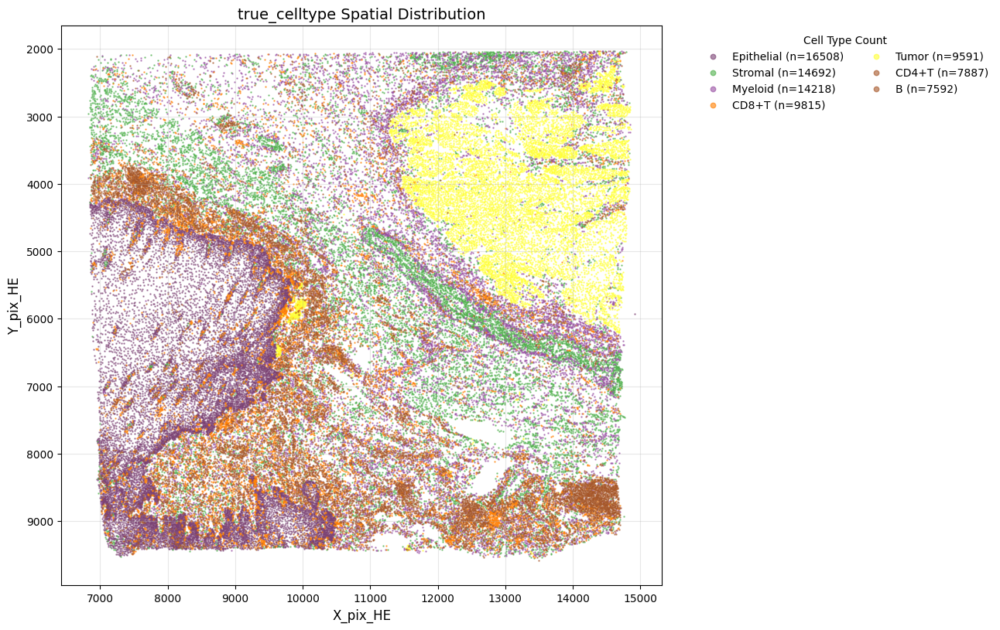

In [15]:
## Plot level1 spatial distribution from all-data predictions
import numpy as np
import pandas as pd

if 'all_preds' not in globals():
    raise ValueError("Please run the previous all-data evaluation cell first.")
if 'class_names_level1' not in globals():
    raise ValueError("class_names_level1 is required to plot level1.")

loaded_data = np.load(matched_features_path)
if 'X_coords' not in loaded_data:
    raise ValueError(f"X_coords not found in {matched_features_path}")

X_coords_all = loaded_data['X_coords']
all_preds_l2 = np.asarray(all_preds)
n = min(len(X_coords_all), len(all_preds_l2))
X_coords_all = X_coords_all[:n]
all_preds_l2 = all_preds_l2[:n]

# Build level2->level1 mapping (same mapping used in HCE training).
num_l2_classes = len(class_names)
child_to_parent = np.full(num_l2_classes, -1, dtype=np.int64)
for l2, l1 in zip(y_encoded_f, y_level1_encoded_f):
    if child_to_parent[int(l2)] == -1:
        child_to_parent[int(l2)] = int(l1)
if np.any(child_to_parent < 0):
    missing = np.where(child_to_parent < 0)[0]
    raise ValueError(f"Missing level1 mapping for level2 classes: {missing}")

preds_l1 = child_to_parent[all_preds_l2]
pred_celltype_l1 = np.array([class_names_level1[int(i)] for i in preds_l1])

pred_df_l1 = pd.DataFrame({
    'X_pix_HE': X_coords_all[:, 0],
    'Y_pix_HE': X_coords_all[:, 1],
    'celltype': pred_celltype_l1,
})

# Add true level1 labels if available in cached npz.
if 'y_level1' in loaded_data:
    y_l1_raw = loaded_data['y_level1'][:n]
    if y_l1_raw.dtype.kind in ['U', 'S', 'O']:
        pred_df_l1['true_celltype'] = y_l1_raw
    else:
        pred_df_l1['true_celltype'] = np.array([class_names_level1[int(i)] for i in y_l1_raw])

plot_celltype_spatial_distribution(
    pred_df_l1,
    x_col='X_pix_HE',
    y_col='Y_pix_HE',
    celltype_col='celltype',
    figsize=(12, 10),
    alpha=0.6,
    s=0.6,
    format='jpg',
    save_path=f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{save_result}/celltype_valid_tumor1_level1_hce.jpg',
)

if 'true_celltype' in pred_df_l1.columns:
    plot_celltype_spatial_distribution(
        pred_df_l1,
        x_col='X_pix_HE',
        y_col='Y_pix_HE',
        celltype_col='true_celltype',
        figsize=(12, 10),
        alpha=0.6,
        s=0.6,
        format='jpg',
        save_path=f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{save_result}/celltype_true_tumor1_level1_hce.jpg',
    )

## HE-feature validation

In [16]:
def make_PCF2HE2StarDist_alignment(
    stardist_coords_path,
    qupath_corner_path,
    codex_meta_celltype_path,
    celltype_pixel_NCRT_path,
    therapy_data="NCRT",
    parent_value='tumor1',
    save_path=None,
    save_path4ViT=None
):
    """
    Align cell coordinates and types from StarDist, ROI, and GroundTruth annotation.
    Save matched cell coordinate files for downstream analysis.

    Returns:
        celltype_anno_df (pd.DataFrame): Celltype annotation dataframe.
        star_coords_in_roi (pd.DataFrame): StarDist coordinates within ROI.
        roi_cell_counts (pd.DataFrame): Cell counts per ROI.
    """

    # Load StarDist cell coordinates (no duplicates)
    star_coords = pd.read_csv(stardist_coords_path)

    # Load ROI coordinates from QuPath annotation
    roi_coords = pd.read_csv(qupath_corner_path)

    # Load celltype metadata and cell pixel coordinates
    celltype_anno_df = pd.read_csv(codex_meta_celltype_path)
    celltype_pixel_NCRT = pd.read_csv(celltype_pixel_NCRT_path)

    # Match StarDist cell coordinates to ROI
    star_coords_in_roi, roi_cell_counts = match_StarCoords2ROI(
        star_coords, roi_coords, therapy_data=therapy_data
    )

    ## Save csv files for downstream analysis
    ## Select GroundTruth celltype pixel coordinates in tumor1
    tumor_id = f"{therapy_data}_{parent_value}"
    celltype_pixel_NCRT_tumor1 = celltype_pixel_NCRT[celltype_pixel_NCRT['TumorID'] == tumor_id]
    print("Cell number in GroundTruth of tumor1:", celltype_pixel_NCRT_tumor1.shape[0])

    ## Select StarDist cell coordinates in tumor1 within ROI
    star_coords_in_roi1 = star_coords_in_roi[star_coords_in_roi['TumorID'] == tumor_id]
    print("Cell number in StarDist of tumor1:", star_coords_in_roi1.shape[0])

    ## Match GroundTruth celltype pixel coordinates to StarDist cell coordinates
    celltype_pixel_NCRT_stardist = match_celltype2stardist(
        celltype_pixel_NCRT_tumor1,
        star_coords_in_roi1,
        celltype_pixel_coords_cols=['X_pix_HE', 'Y_pix_HE'],
        stardist_pixel_coords_cols=['centroid_x', 'centroid_y']
    )

    ## Save matched celltype pixel coordinates
    saved = False
    if save_path is not None:
        celltype_pixel_NCRT_stardist.to_csv(save_path, index=False)
        print(f"Celltype pixel coordinates DataFrame saved to {save_path}")
        saved = True
    if save_path4ViT is not None:
        celltype_pixel_NCRT_stardist4ViT = celltype_pixel_NCRT_stardist.copy()
        celltype_pixel_NCRT_stardist4ViT.rename(
            columns={'centroid_x': 'pxl_row_in_fullres', 'centroid_y': 'pxl_col_in_fullres'},
            inplace=True
        )
        celltype_pixel_NCRT_stardist4ViT.to_csv(save_path4ViT, index=False)
        print(f"Celltype pixel coordinates DataFrame for ViT saved to {save_path4ViT}")
        saved = True
    if not saved:
        print("Celltype pixel coordinates DataFrame not saved.")

    return celltype_anno_df, roi_cell_counts, star_coords_in_roi, celltype_pixel_NCRT

In [ ]:
## From YuLu
# ## Option A: Using HIPT (recommended for quick start, no token required) - 6m57.2s
# %cd /home/lingyu/ssd2/Python/Hist2Pheno/
# !python code/StarDist_nuclei_segmente.py \

In [17]:
stardist_coords_path = f'{path}Hist2Pheno/data/CODEX/ESCC/{stardist_data}/{therapy_data}_Float_prob0.01_nms_0.3.csv'
qupath_corner_path = f'{path}Hist2Pheno/data/CODEX/ESCC/{qupath_corner}/{therapy_data}_ROI_Corners.csv'
codex_meta_celltype_path = f'{path}Hist2Pheno/data/CODEX/ESCC/codex_meta_celltype_final.csv'
celltype_pixel_NCRT_path = f'{path}Hist2Pheno/data/CODEX/ESCC/{transfer_data}/{therapy_data}_CellPixCoords.csv'
save_path = f'{path}Hist2Pheno/data/CODEX/ESCC/he_cell_coords/{therapy_data}_CellPixCoords_tumor1_StarDist.csv'
save_path4ViT = f'{path}Hist2Pheno/data/CODEX/ESCC/he_cell_coords/{therapy_data}_CellPixCoords_tumor1_StarDist_ViT.csv'

celltype_anno_df, roi_cell_counts, star_coords_in_roi, celltype_pixel_NCRT = make_PCF2HE2StarDist_alignment(
    stardist_coords_path,
    qupath_corner_path,
    codex_meta_celltype_path,
    celltype_pixel_NCRT_path,
    therapy_data="NCRT",
    parent_value='tumor1',
    save_path=save_path,
    save_path4ViT=save_path4ViT
)

/home/lingyu/ssd2/Python/Collaborate/esccAI/code/base.py:2887: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'NCRT_tumor27' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  star_coords.loc[mask, 'TumorID'] = name


Number of rows with TumorID = NaN: 2676
star_coords shape after filtering: (2025438, 4)
       TumorID   centroid_x   centroid_y  probability
0  NCRT_tumor1  6863.988266  3320.483284     0.884281
1  NCRT_tumor1  7168.098045  1736.226154     0.878382
2  NCRT_tumor1  7189.928642  1536.107811     0.877665
3  NCRT_tumor1  7227.680878  1686.196735     0.875756
4  NCRT_tumor1  7272.088211  2399.935646     0.872943
Nuclei number within each ROI (sorted by TumorID):
         TumorID  cell_count
2    NCRT_tumor1       94963
4    NCRT_tumor2       91422
26   NCRT_tumor3       43568
18   NCRT_tumor4       65337
5    NCRT_tumor5       86115
23   NCRT_tumor6       58079
27   NCRT_tumor7       25843
25   NCRT_tumor8       53104
10   NCRT_tumor9       77542
24  NCRT_tumor10       57359
8   NCRT_tumor11       79697
9   NCRT_tumor12       79563
14  NCRT_tumor13       72766
11  NCRT_tumor14       74430
21  NCRT_tumor15       60176
20  NCRT_tumor16       61779
7   NCRT_tumor17       84053
3   NCRT_tumor1

ROIs where orange bar (HE: cell_count) is lower than blue bar (PCF: celltype_count):
['NCRT_tumor3', 'NCRT_tumor25']


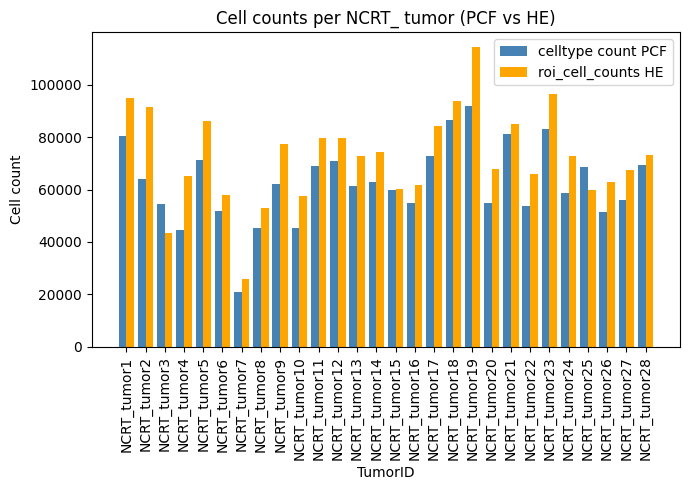

In [18]:
merged = plot_WSI_counts(celltype_anno_df, roi_cell_counts, prefix='NCRT_', figure_size=(7,5),
                         save_path=None)
                        # save_path=f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{save_result}/cellcounts_compare.pdf')

NCRT_tumor3 - star_coords_in_roi shape: (43568, 4)
NCRT_tumor3 - celltype_pixel_NCRT shape: (54500, 13)


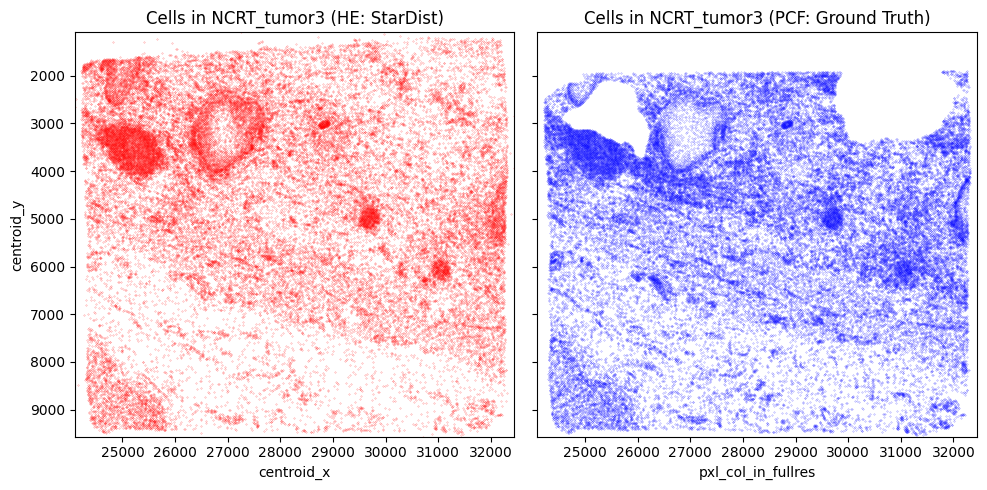

In [19]:
plot_PCF_HE_counts(star_coords_in_roi, celltype_pixel_NCRT, ROI='NCRT_tumor3', figure_size=(10,5),
                    save_path=None)
                #    save_path=f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{save_result}/cellcounts_compare_tumor3.jpg')

In [ ]:
# ## Option A: Using HIPT (recommended for quick start, no token required) - 6m57.2s
# %cd /home/lingyu/ssd2/Python/Hist2Pheno/
# !python code/Image_feature_extraction.py \
#    --dataset sc_NCRT \
#    --position_path data/he_cell_coords/NCRT_CellPixCoords_tumor1_StarDist_ViT.csv \
#    --rawimage_path 'data/NCRT/NCRT HE.qptiff' \
#    --scale_image False \
#    --method HIPT \
#    --patch_size 16 \
#    --output_img data/NCRT/NCRT_project_tumor1/ImgEmbeddings_tumor1_stardist/sc_pth_16_16_image \
#    --output_pth data/NCRT/NCRT_project_tumor1/ImgEmbeddings_tumor1_stardist/sc_pth_16_16 \
#    --logging data/NCRT/NCRT_project_tumor1/ImgEmbeddings_tumor1_stardist/ \
#    --scale 0.5  

## Predict StarDist

In [21]:
celltype_pixel_NCRT_stardist_path = f'{path}Hist2Pheno/data/CODEX/ESCC/{transfer_data}/{therapy_data}_CellPixCoords_tumor1_StarDist.csv'
embedding_star_dir = Path(f"{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/ImgEmbeddings_tumor1_stardist/sc_pth_16_16")
matched_features_star_path = f"{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/matched_features_tumor1_stardist.npz"


celltype_pixel_NCRT_stardist = pd.read_csv(celltype_pixel_NCRT_stardist_path)
# celltype_pixel_NCRT_stardist.head()

## Load HIPT embeddings for StarDist predictions.
embeddings_star_dict = load_hist_embeddings(embedding_star_dir)

## Match StarDist coordinates to embeddings and cache matched features.
X_star, y_star, y_star_level1, X_coords_star = prepare_matched_embeddings(
    celltype_pixel_NCRT_stardist,
    embeddings_star_dict,
    matched_features_star_path,
    coord_cols=("centroid_x", "centroid_y"),
)

if X_coords_star is not None:
    print(f"  ✓ StarDist coordinates loaded: {X_coords_star.shape}")
else:
    print("  ⚠ StarDist coordinates not available (old format)")

Loading HIPT embeddings from .pth files...
  Loading embeddings...


Loading .pth files: 100%|██████████| 77996/77996 [00:13<00:00, 5659.19it/s]


  Successfully loaded 77996 embeddings
  Embedding dimension: (384,)

Loading pre-saved matched data...
  ✓ Loaded from /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1/matched_features_tumor1_stardist.npz
  X shape: (77996, 384)
  y shape: (77996,)
  Number of classes: 40
  ✓ Coordinates found in saved data
  ✓ StarDist coordinates loaded: (77996, 2)


In [22]:
# Load best model for StarDist prediction.
print("Loading best model for StarDist prediction...")

checkpoint_path = get_best_checkpoint_path(path, therapy_data)
state_dict = torch.load(checkpoint_path, map_location=device if "device" in globals() else "cpu")

# Infer model dimensions from checkpoint weights.
input_dim_star = state_dict["input_layer.0.weight"].shape[1]
num_classes_star = state_dict["output_layer.weight"].shape[0]

if "device" not in globals():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model_star = ImprovedMLPClassifier(
    input_dim=input_dim_star,
    num_classes=num_classes_star,
    hidden_dims=[1024, 512, 256],
    dropout=0.2,
).to(device)

model_star.load_state_dict(state_dict)
print("✓ StarDist model loaded")

Loading best model for StarDist prediction...
✓ StarDist model loaded


In [28]:
# all_preds
all_labels

  Loading data from matched_features_path...
  ✓ Loaded X from /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1/matched_features_tumor1_stardist.npz: (77996, 384)
  ✓ Loaded y from /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1/matched_features_tumor1_stardist.npz: (77996,), dtype: <U21
  ⚠ prediction_only=True: Labels will be used for visualization only, not for evaluation.
  ✓ Keeping labels as strings for visualization (no encoding needed)
  ✓ Scaled X using provided scaler
  X_all_scaled shape: (77996, 384)
  No labels available - prediction mode only
X_all_scaled:  (77996, 384)
dummy_labels:  (77996,)
  ⚠ Large dataset detected (77996 samples). Setting num_workers=0 to avoid indexing issues.
  Total samples: 77996
  DataLoader batch_size: 1024, num_workers: 0
  Predicting on new data (no labels for evaluation)...


Predicting: 100%|██████████| 77/77 [00:00<00:00, 125.57it/s]



Prediction completed:
  Total predictions: 77996
  Predicted classes: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38]
  ✓ Using original labels for visualization: 77996 labels

Preparing spatial distribution plot...
  Matching predictions with coordinates...
  ✓ Loaded coordinates from /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1/matched_features_tumor1_stardist.npz: (77996, 2)
  Coordinates shape: (77996, 2)
  Predictions shape: (77996,)
  ✓ Created prediction DataFrame with 77996 cells

Plotting spatial distribution of PREDICTED cell types...
Number of valid data points: 77996
Number of cell types: 39

Plotting spatial distribution of TRUE cell types (for comparison)...
Number of valid data points: 77996
Number of cell types: 39


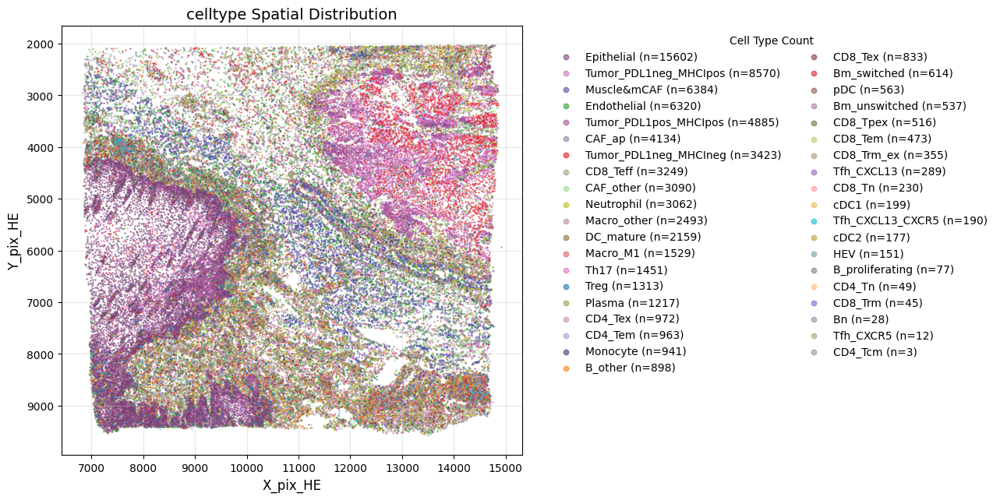

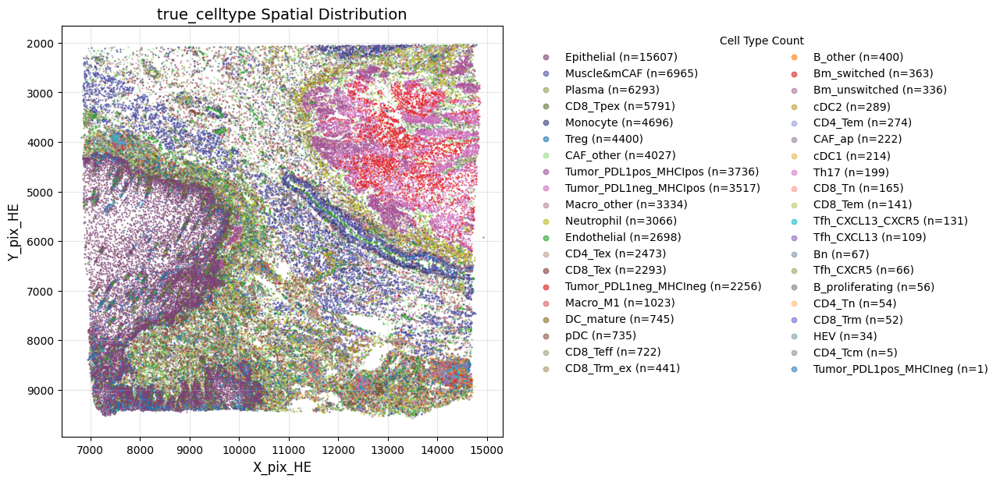

In [24]:
# Predict on StarDist-matched data and plot spatial distribution (level2 + level1).
class_names_star = class_names if "class_names" in globals() and class_names is not None else [
    str(i) for i in range(num_classes_star)
]

all_acc, all_macro_f1, all_weighted_f1, all_preds, all_labels = evaluate_and_plot_on_all_data(
    model=model_star,
    matched_features_path=matched_features_star_path,
    class_names=class_names_star,
    evaluate=evaluate,
    plot_celltype_spatial_distribution=plot_celltype_spatial_distribution,
    CellTypeDataset=CellTypeDataset,
    device=device,
    scaler=scaler,
    val_loader=None,
    prediction_only=True,
    # Optional coordinate fallback when X_coords are missing in npz.
    X_coords_matched=X_coords_star if "X_coords_star" in globals() else None,
    celltype_pred_dir=f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{save_result}/celltype_pred_tumor1_level2_hce.jpg',
    celltype_pixel_NCRT_tumor1=celltype_pixel_NCRT_stardist if "celltype_pixel_NCRT_stardist" in globals() else None,
)

Number of valid data points: 77996
Number of cell types: 7
Number of valid data points: 77996
Number of cell types: 7
Saved StarDist level1 predicted/true spatial plots.


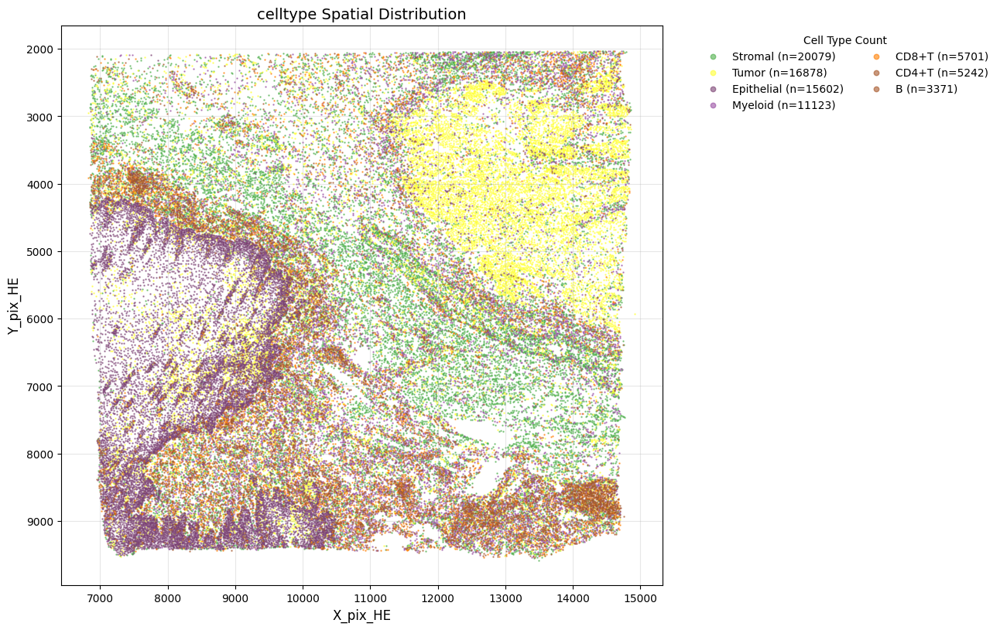

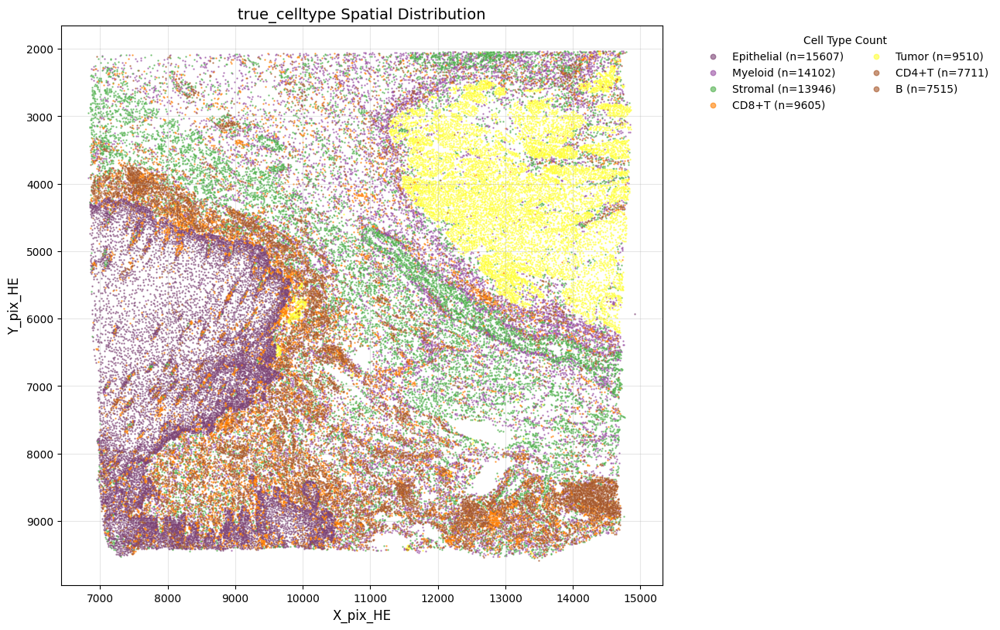

In [32]:
save_path_pred = f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{save_result}/celltype_pred_tumor1_level1_hce.jpg'
save_path_true = f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{save_result}/celltype_true_tumor1_level1_hce.jpg'

plot_level1_spatial_distribution(
    matched_features_path=matched_features_star_path,
    all_preds=all_preds,
    class_names_level1=class_names_level1,
    class_names=class_names,
    y_encoded_f=y_encoded_f,
    y_level1_encoded_f=y_level1_encoded_f,
    plot_celltype_spatial_distribution=plot_celltype_spatial_distribution,
    save_path_pred=save_path_pred,
    save_path_true=save_path_true
)
print("Saved StarDist level1 predicted/true spatial plots.")